In [1]:
import numpy as np
import pandas as pd
import os
import itertools
import glob
import re
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
import matplotlib

In [2]:
from PreprocessingLabeledData import *
from AddingPredProbAndLabel2DF import *
from OverLapReturner import OverLapReturner
from SelectingBestNonOverlappingHits import *

In [3]:
%matplotlib inline

In [4]:
sns.set(rc={'figure.figsize':(8,6)})

In [5]:
TbData = pd.read_csv("../intermediates/Tb/result_aln_pf_Tb_tm_labeled.tsv", sep="\t")
TbData = PreprocessingLabeledData(TbData)
LabeledData_tb = TbData[TbData["Status"]!=-1]
LabeledData_tb = LabeledData_tb.sample(frac=1, random_state=1).reset_index(drop=True)

X = LabeledData_tb.values
y = LabeledData_tb['Status'].values

In [6]:
 X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.9, test_size=0.1, shuffle=False)

In [8]:
X_train_demo = pd.DataFrame(X_train, columns=LabeledData_tb.columns)[['fident', 'alnlen', "MismatchRatio", "GapOpenRatio", 'qlen', 'bits',
       'alntmscore', 'Status', 'FracOfPf']]
#    X_train[['fident', 'alnlen', 'mismatch', 'gapopen', 'qlen', 'bits',
#       'alntmscore', 'Status', 'FracOfPf', 'p_evalue']]
X_train_demo.columns = ["fident", "alnlen", "nmismatch", "ngapopen","pflen", 
                       "bit score", "TM-score", "Label", "pfcov"]
#SelShort = X_train_demo.sample(frac=0.1)
sns.set(font_scale=2)
sns.set_style("white")

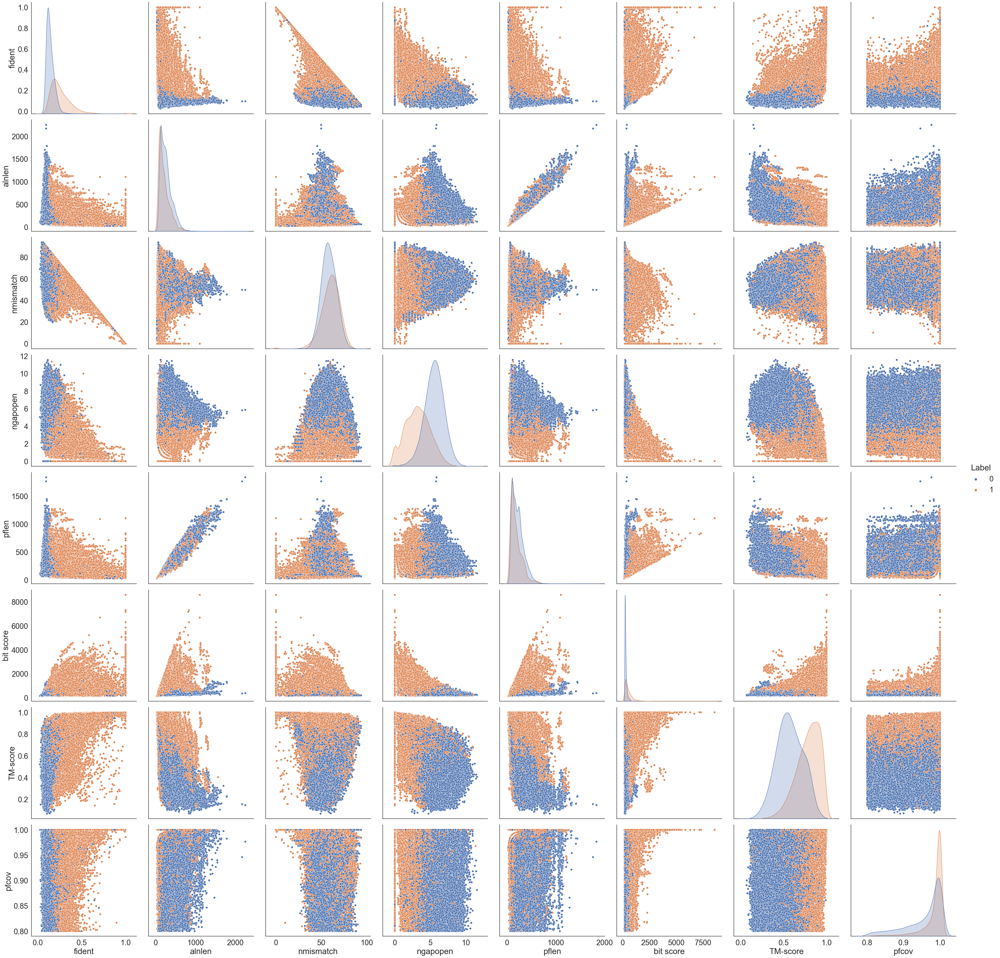

In [18]:
g = sns.pairplot(X_train_demo, hue = 'Label', diag_kws={'bw': 0.2}, height=5)

In [ ]:
XforTSNE = X_train_demo[["fident", "alnlen", "nmismatch", "ngapopen","pflen", 
                       "bit score", "TM-score", "pfcov"]]
scaler = MinMaxScaler()
XforTSNE = scaler.fit_transform(XforTSNE)
yForTSNE = X_train_demo[["Label"]]
tsne = TSNE(n_components = 2, n_jobs=-1)
X_embedded = tsne.fit_transform(XforTSNE)
dim1 = X_embedded[:0]
dim2 = X_embedded[:1]
label = yForTSNE

This compuatation was so heavy. I did the computation on a computational server, and uploaded the results here. I have commented importing the dimensionally reduced data to keep the integrity of this notebook.

In [11]:
#tsne_data = pd.read_csv("../intermediates/Tb/X_embedded.csv", sep="\t")
#dim1 = tsne_data["dim1"]
#dim2 = tsne_data["dim2"]
#label = tsne_data["label"]

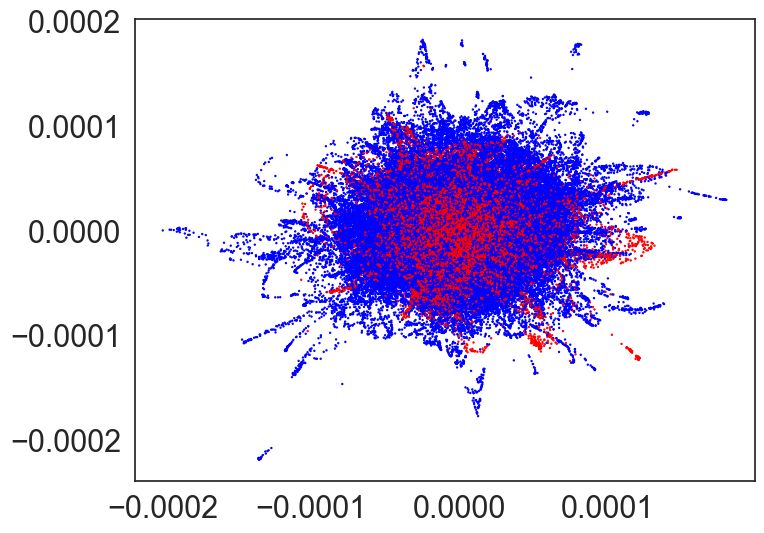

In [12]:
plt.scatter(dim1, dim2, c = label, s = 0.5, cmap=matplotlib.colors.ListedColormap(["red", "blue"]))